# Yogesh Kakde

In [72]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns

In [59]:
df = pd.read_csv('D:\\EDUCATION AND STUDIES\\YOGESH\\Internship GRIP Spark Foundation\\Task 4\\globalterrorismdb_0718dist.csv', encoding='latin1',low_memory=False)

In [60]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 181691 entries, 0 to 181690
Columns: 135 entries, eventid to related
dtypes: float64(55), int64(22), object(58)
memory usage: 187.1+ MB


In [61]:
print(df.shape)

(181691, 135)


In [62]:
print(df.columns)

Index(['eventid', 'iyear', 'imonth', 'iday', 'approxdate', 'extended',
       'resolution', 'country', 'country_txt', 'region',
       ...
       'addnotes', 'scite1', 'scite2', 'scite3', 'dbsource', 'INT_LOG',
       'INT_IDEO', 'INT_MISC', 'INT_ANY', 'related'],
      dtype='object', length=135)


In [63]:
df.columns.values  # displaying the column values of the dataset...


array(['eventid', 'iyear', 'imonth', 'iday', 'approxdate', 'extended',
       'resolution', 'country', 'country_txt', 'region', 'region_txt',
       'provstate', 'city', 'latitude', 'longitude', 'specificity',
       'vicinity', 'location', 'summary', 'crit1', 'crit2', 'crit3',
       'doubtterr', 'alternative', 'alternative_txt', 'multiple',
       'success', 'suicide', 'attacktype1', 'attacktype1_txt',
       'attacktype2', 'attacktype2_txt', 'attacktype3', 'attacktype3_txt',
       'targtype1', 'targtype1_txt', 'targsubtype1', 'targsubtype1_txt',
       'corp1', 'target1', 'natlty1', 'natlty1_txt', 'targtype2',
       'targtype2_txt', 'targsubtype2', 'targsubtype2_txt', 'corp2',
       'target2', 'natlty2', 'natlty2_txt', 'targtype3', 'targtype3_txt',
       'targsubtype3', 'targsubtype3_txt', 'corp3', 'target3', 'natlty3',
       'natlty3_txt', 'gname', 'gsubname', 'gname2', 'gsubname2',
       'gname3', 'gsubname3', 'motive', 'guncertain1', 'guncertain2',
       'guncertain3', 'in

In [64]:
df = df[["iyear", "imonth", "iday","country", "country_txt", "region_txt", "city","success", "attacktype1_txt","nkill", "propvalue", "targtype1_txt","latitude","gname","longitude", "targsubtype1_txt","target1","weaptype1_txt", "weapdetail"]]

In [65]:
df.rename(columns = {'iyear':'Year', "imonth":"Month","iday":"Day", "country":"Country_no",
                     "country_txt":"Country","region_txt":"Region","city":"City", "propvalue":"property_value",
                     "attacktype1_txt":"Attack_type", "targtype1_txt":"Target_type","gname":"group_name",
                     "targsubtype1_txt":"Target_sub_type", "target1":"Target", "nkill":"no_of_kills",
                     "weaptype1_txt":"Weapon_type", "weapdetail":"Weapon_detail"}, inplace = True)  # Renaming the column values...

In [66]:
# displaying the null values of each dataset...

df.isnull().sum()  


Year                    0
Month                   0
Day                     0
Country_no              0
Country                 0
Region                  0
City                  434
success                 0
Attack_type             0
no_of_kills         10313
property_value     142702
Target_type             0
latitude             4556
group_name              0
longitude            4557
Target_sub_type     10373
Target                636
Weapon_type             0
Weapon_detail       67670
dtype: int64

In [69]:
df.shape

(181691, 19)

# Filling missing values

In [70]:
df["City"].fillna("Unknown", inplace = True)
df["Target"].fillna("Unknown", inplace = True)
df["property_value"].fillna(0, inplace = True)
df["no_of_kills"].fillna(0, inplace = True)

In [86]:
# Some Destructive facts


print("Country with the most attacks:",df['Country'].value_counts().idxmax())
print("City with the most attacks:",df['City'].value_counts().index[1]) #as first entry is 'unknown'
print("Region with the most attacks:",df['Region'].value_counts().idxmax())
print("Year with the most attacks:",df['Year'].value_counts().idxmax())
print("Month with the most attacks:",df['Month'].value_counts().idxmax())
print("Group with the most attacks:",df['group_name'].value_counts().index[1])
print("Most Attack Types:",df['Attack_type'].value_counts().idxmax())

Country with the most attacks: Iraq
City with the most attacks: Baghdad
Region with the most attacks: Middle East & North Africa
Year with the most attacks: 2014
Month with the most attacks: 5
Group with the most attacks: Taliban
Most Attack Types: Bombing/Explosion


# Exploratory Data Analysis

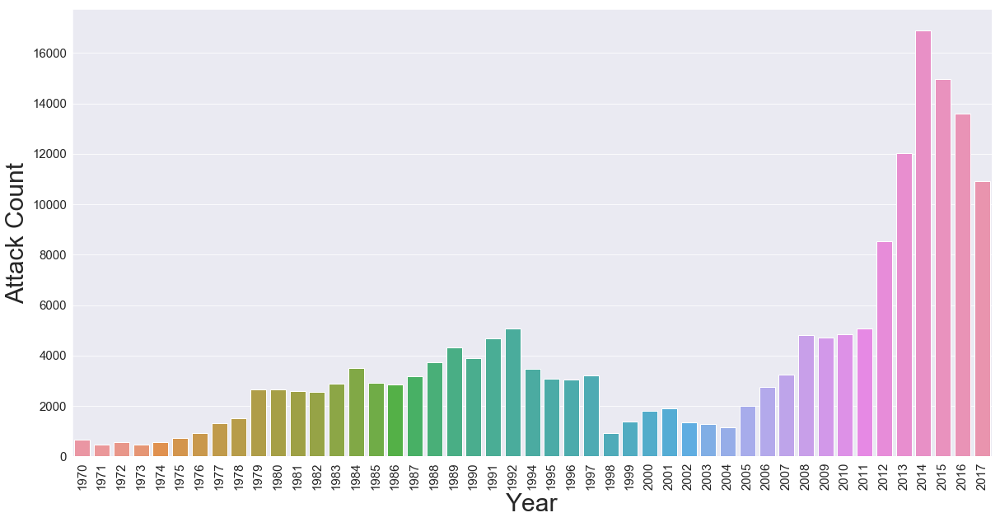

In [104]:
plt.figure(figsize=(20,10))
ed=sns.countplot(x ='Year', data = df)
ed.set_xticklabels(ed.get_xticklabels(),rotation=90)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel('Year', fontsize=30) 
plt.ylabel('Attack Count', fontsize=30)
plt.show()

# Conclusion in respect of number of attacks

1. The Highest number of attacks takes place in the year 2014. and second highest attacks are in year 2015
2. The Lowest number of attacks takes place in the year 1971 and 1973.

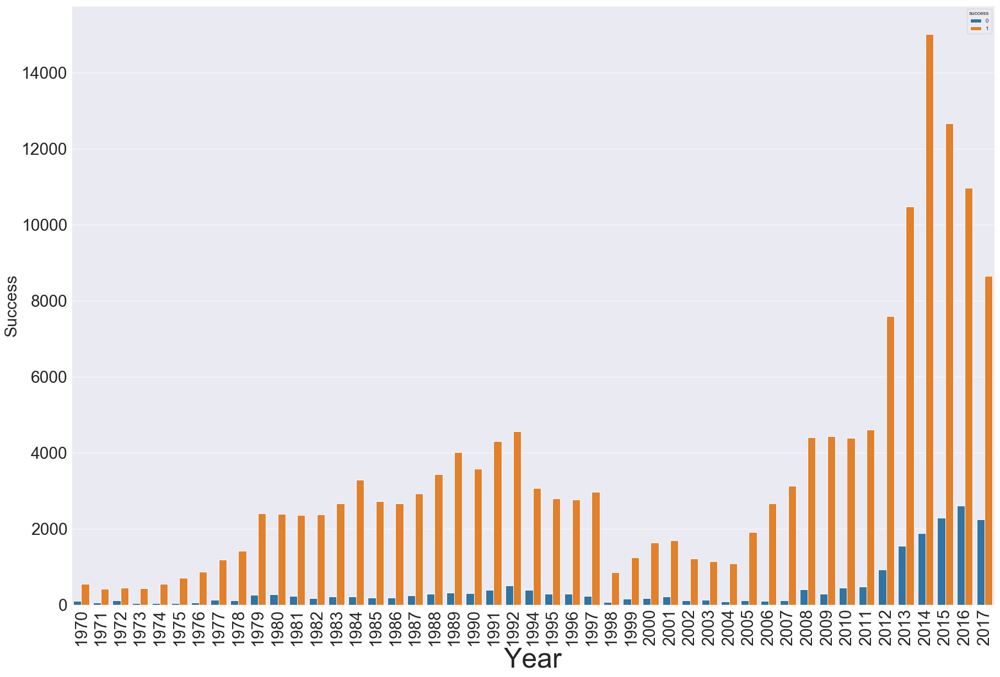

In [79]:
plt.figure(figsize=(30,20))
ed=sns.countplot(x ='Year', hue = "success", data = df)
ed.set_xticklabels(ed.get_xticklabels(),rotation=90)
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)
plt.xlabel('Year', fontsize=50) 
plt.ylabel('Success', fontsize=30)
plt.show()

# Conclusion in respect of success rate of attacks

1. The Highest number of Succesfull attacks takes place in the year 2014. (Secong highest success rate is in 2015)

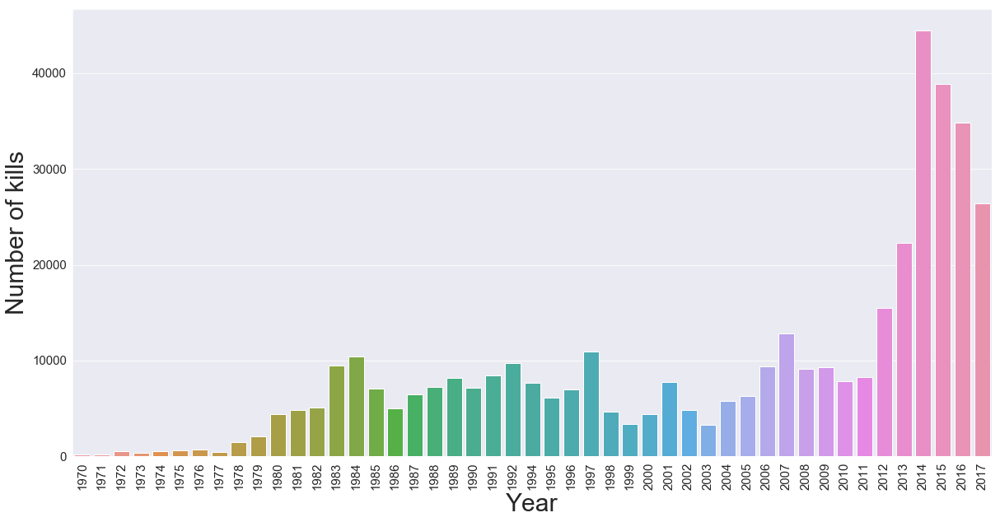

In [90]:
plt.figure(figsize=(20,10))
states = df.groupby(['Year'])['no_of_kills'].sum().reset_index()
states.sort_values(by=['no_of_kills'], inplace=True)
ed=sns.barplot(x = 'Year', y='no_of_kills', data=states)
ed.set_xticklabels(ed.get_xticklabels(),rotation=90)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel('Year', fontsize=30) 
plt.ylabel('Number of kills', fontsize=30)
plt.show()

# Conclusion in respect of Number of people killed

1. The Highest number of people killed in the year 2014. (Secong highest success rate is in 2015)

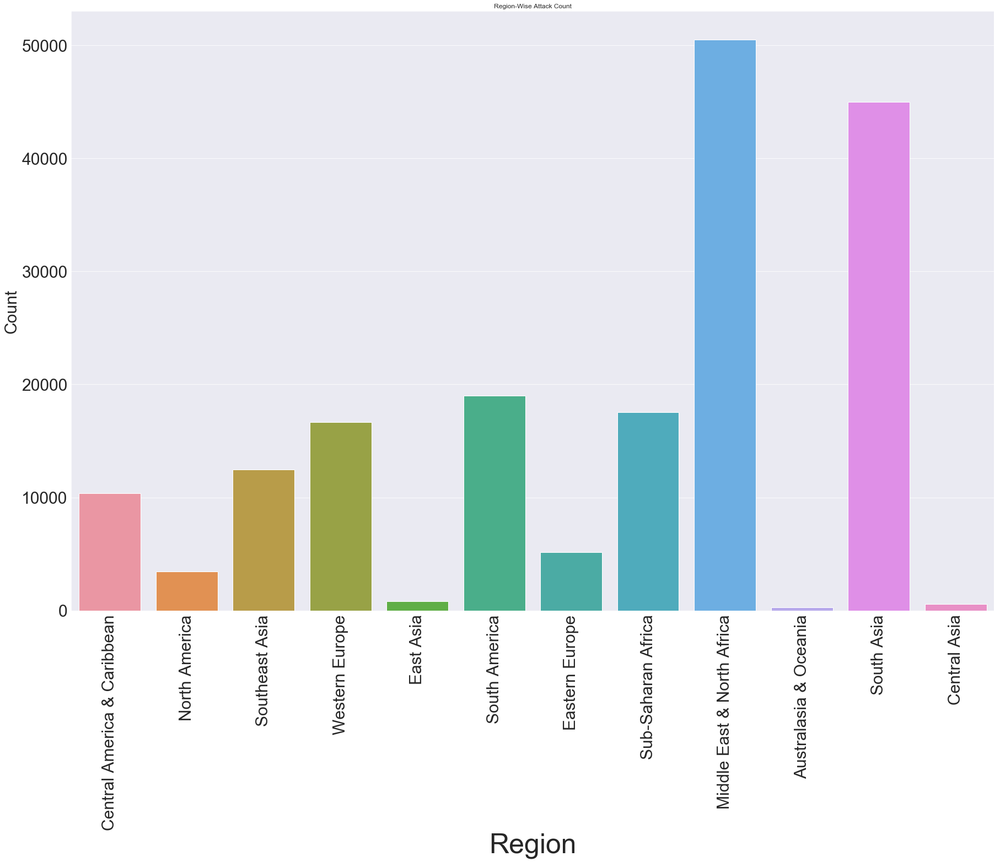

In [93]:
plt.figure(figsize=(30,20))
ed=sns.countplot(x ='Region', data = df)
ed.set_xticklabels(ed.get_xticklabels(),rotation=90)
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)
plt.xlabel('Region', fontsize=50) 
plt.ylabel('Count', fontsize=30)
plt.title("Region-Wise Attack Count")
plt.show()

# Conclusion in respect of region wise attacks

1. Highest number of attacks are in the region Middle East and North Africa

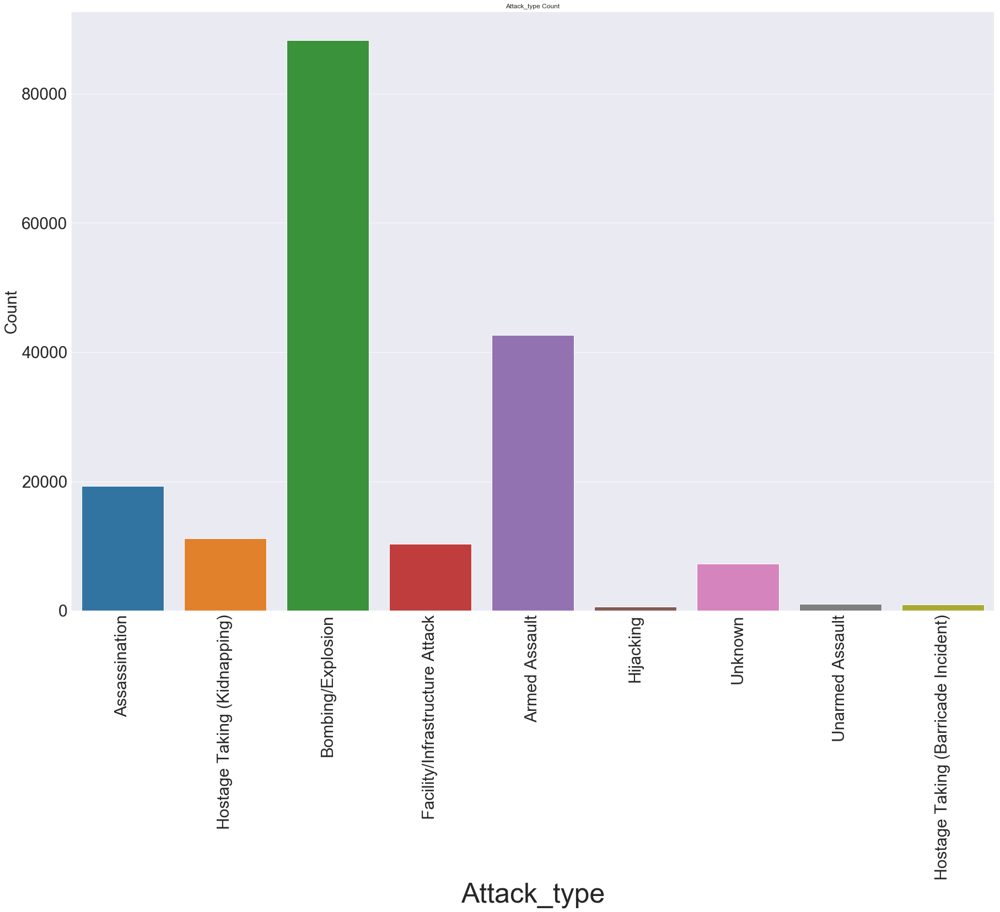

In [97]:
plt.figure(figsize=(30,20))
ed=sns.countplot(x ='Attack_type', data = df)
ed.set_xticklabels(ed.get_xticklabels(),rotation=90)
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)
plt.xlabel('Attack_type', fontsize=50) 
plt.ylabel('Count', fontsize=30)
plt.title("Attack_type Count")
plt.show()




# Conclusion 
Highest type of attack made is Bombing and Explosion

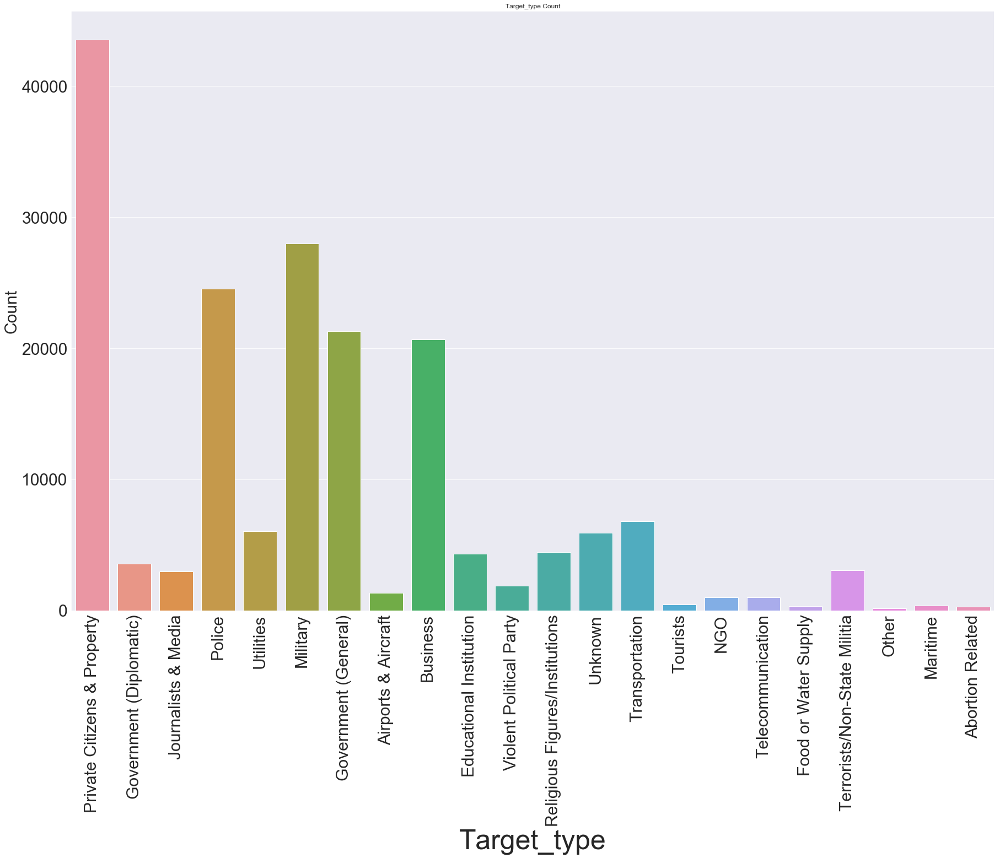

In [99]:
plt.figure(figsize=(30,20))
ed=sns.countplot(x ='Target_type', data = df)
ed.set_xticklabels(ed.get_xticklabels(),rotation=90)
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)
plt.xlabel('Target_type', fontsize=50) 
plt.ylabel('Count', fontsize=30)
plt.title("Target_type Count")
plt.show()




In [107]:
# using piechart to display the number of kills in each target
import plotly.express as px

px.pie(df, values='no_of_kills', names='Target_type', title='Number of Kills in each target') 


# Conclusion

Highest attack were made to private citizens and properties and highest kills are also in same group